# **MA5608 Optimización estocástica y aprendizaje de máquinas**

## **Sesión práctica 2: Regularización y Redes neuronales convolucionales.**

En esta sesión utilizaremos [PyTorch](https://pytorch.org/?ajs_aid=1eace79d-9f70-4a7a-bb80-8e175476eda8) como *backend* de Deep Learning, aunque también otras populares son [TensorFlow](https://www.tensorflow.org/?hl=es-419) y [JAX](https://docs.jax.dev/en/latest/index.html). Entrenaremos una red neuronal para clasificar radiografías de Tórax para predecir si una persona tiene COVID-19 o no, utilizando el siguiente [*dataset*](https://www.kaggle.com/datasets/tawsifurrahman/covid19-radiography-database).

### **Librerías**

In [1]:
# Importación de bibliotecas clave para análisis y aprendizaje automático
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Plotly solo para un ejemplo
import plotly.graph_objects as go

# Módulos para preparar los datos y evaluar el modelo
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn.preprocessing import LabelEncoder

# Módulos de PyTorch para la construcción y entrenamiento de la red neuronal
import torch
import torch.nn as nn
import torch.functional as F
import torch.optim as optim

# Bibliotecas de utilidad para manejar archivos y datos de imagen
import os
import cv2
from tqdm import tqdm

### **Regularización**

Aproximaremos una función seno de la forma

$$ y(x) = \sin(w \cdot x + b) $$

donde $w$ y $b$ son parámetros desconocidos y veremos la función de pérdida en función de los parámetros.

In [2]:
# Estos son los parámetros reales
w_real, b_real = 1.5, 1.

# Función real
def f(x):
    return torch.sin(w_real * x + b_real)

# Puntos para los datos
x = np.linspace(-10, 10, 50)

# Malla de parámetros
w_values = np.linspace(-3, 3, 100)
b_values = np.linspace(-3, 3, 100)

w, b = np.meshgrid(w_values, b_values)

# Datos reales de la función seno
true_sin = np.sin(w_real * x + b_real)

In [3]:
def plot_loss_surface(mean_losses, reg_params, w,b,w_real,b_real):

  frames = []
  for i, reg_param in enumerate(reg_params):
      frame = go.Frame(
          data=[go.Surface(z=mean_losses[i], x=w, y=b)],
          name=str(reg_param),
          layout=go.Layout(
              title=f'Regularization Parameter: {reg_param:.2f}',
              scene=dict(zaxis=dict(range=[0, 5]))
          )
      )
      frames.append(frame)

  fig = go.Figure(
      data=[go.Surface(z=mean_losses[0], x=w, y=b)],
      frames=frames,
      layout=go.Layout(
          scene=dict(zaxis=dict(range=[0, 5]))
      )
  )

  fig.add_trace(
      go.Scatter3d(
          x=[w_real],
          y=[b_real],
          z=[0],
          mode='markers',
          marker=dict(color='magenta', size=10),
          name='Real Parameters'
      )
  )

  fig.update_layout(
      title='Función de pérdida para aprender una función seno',
      scene_aspectmode='cube',
      scene=dict(
          xaxis_title='Weight (w)',
          yaxis_title='Bias (b)',
          zaxis_title='Loss',
          zaxis=dict(range=[0, 5])
      ),
      updatemenus=[
          dict(
              type="buttons",
              buttons=[dict(label="Play", method="animate", args=[None, {"frame": {"duration": 500, "redraw": True}, "fromcurrent": True}])],
              pad={"r": 10, "t": 87},
              showactive=False,
              x=0.1,
              xanchor="left",
              y=0,
              yanchor="bottom"
          )
      ],
      sliders=[
          dict(
              active=0,
              currentvalue={"prefix": "Reg Param: "},
              pad={"t": 50},
              steps=[dict(label=str(reg_param), method="update", args=[[{"z": [mean_losses[i]], "x": [w], "y": [b]}], {"scene": {"zaxis": {"range": [0, 5]}}}]) for i, reg_param in enumerate(reg_params)]
          )
      ]
  )

  fig.show()

In [4]:
# Distintos parámetros de regularización
reg_params = np.linspace(0, 1, 11)

# Loss promedio para cada parámetros de regularización
mean_losses = []
for reg_param in reg_params:
    # Salida de la red
    network_output = np.sin(w * x[:, None, None] + b)
    # Función de pérdida
    loss = (network_output - true_sin[:, None, None])**2 + reg_param*(w**2 + b**2)
    # Pérdida promedio
    mean_loss = loss.mean(axis=0)
    mean_losses.append(mean_loss)

plot_loss_surface(mean_losses, reg_params, w,b,w_real,b_real)

### **Redes convolucionales**

In [5]:
# Importa la biblioteca `kagglehub` para acceder a modelos y conjuntos de datos de Kaggle
import kagglehub

# Descarga la versión más reciente del conjunto de datos de radiografías de COVID-19
path = kagglehub.dataset_download("tawsifurrahman/covid19-radiography-database")

# Imprime la ruta local donde se guardaron los archivos del conjunto de datos
print("Path to dataset files:", path)

Using Colab cache for faster access to the 'covid19-radiography-database' dataset.
Path to dataset files: /kaggle/input/covid19-radiography-database


In [6]:
# Lista vacía para almacenar las rutas de las imágenes encontradas
imagePaths = []

# Recorre recursivamente el árbol de directorios a partir de la ruta de entrada
for dirname, _, filenames in os.walk(path):
    # Verifica si el directorio actual contiene 'images' en su nombre
    if 'images' in dirname:
        # Itera sobre cada archivo en el directorio 'images'
        for filename in filenames:
            # Comprueba si el archivo termina con la extensión '.png'
            if filename.endswith('png'):
                # Construye la ruta completa y la añade a la lista
                imagePaths.append(os.path.join(dirname, filename))

In [7]:
# Fija una semilla para la generación de números aleatorios para asegurar la reproducibilidad
#np.random.seed(42)
# Define la cantidad de datos a tomar de cada clase
data_amount = 500

# Diccionario para mapear nombres de carpetas a etiquetas más descriptivas
cat = {'Viral Pneumonia': 'Pneumonia', 'Normal': 'Normal', 'COVID': 'Covid-19'}

# Define el tamaño de redimensionamiento de las imágenes
resize = 150

# Define la ruta raíz del conjunto de datos y las carpetas a procesar
root = path + "/COVID-19_Radiography_Dataset/"
folders = ["Normal", "COVID"]

# Listas para almacenar las imágenes y sus etiquetas
Data = []
Target = []

# Itera sobre las carpetas de interés
for fold in folders:
    # Construye la ruta de la carpeta de imágenes
    root_ = root + fold + "/images/"
    # Obtiene la lista de archivos en la carpeta
    listd = np.array(os.listdir(root_))
    # Crea una permutación aleatoria de índices para seleccionar imágenes al azar
    perm = np.random.permutation(data_amount)
    # Selecciona un subconjunto aleatorio de archivos
    listd = listd[perm]

    # Itera sobre los archivos seleccionados con una barra de progreso
    for filename in tqdm(listd):
        if filename.endswith(".png"):
            # Lee, convierte el color, redimensiona y normaliza la imagen
            img = cv2.imread(os.path.join(root_, filename))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = cv2.resize(img, (resize, resize)) / 255.0
            # Añade la imagen procesada y su etiqueta a las listas correspondientes
            Data.append(img)
            Target.append(cat[fold])

100%|██████████| 500/500 [00:04<00:00, 117.26it/s]


In [8]:
# Crea una instancia de `LabelEncoder` para codificar etiquetas de texto a números enteros
le = LabelEncoder()
# Transforma las etiquetas de la lista 'Target' (e.g., 'Normal', 'Pneumonia') a enteros
labels = le.fit_transform(Target)
# Nota: La línea `to_categorical` está comentada porque se usará la función de PyTorch

# Realiza la codificación One-Hot de las etiquetas numéricas usando PyTorch
# Esto convierte cada número entero en un vector binario, útil para el entrenamiento
labels = torch.nn.functional.one_hot(torch.tensor(labels), num_classes=len(le.classes_))

# Imprime las clases de etiquetas originales
print(le.classes_)
# Imprime el vector One-Hot de la primera etiqueta para ver el resultado
print(labels[0])

['Covid-19' 'Normal']
tensor([0, 1])


In [9]:
# Realiza la primera división de los datos en conjuntos de entrenamiento (80%) y prueba (20%)
# El argumento `stratify` asegura que las proporciones de las clases sean las mismas en ambos conjuntos
(x_train, x_test, y_train, y_test) = train_test_split(Data, labels, test_size=0.20, stratify=labels, random_state=42)

# Divide el conjunto de entrenamiento en conjuntos de entrenamiento (80%) y validación (20%)
# El conjunto de validación se usa para ajustar los hiperparámetros del modelo sin usar los datos de prueba
(x_train, x_val, y_train, y_val) = train_test_split(x_train, y_train, test_size=0.20, stratify=y_train, random_state=42)

# Convierte las listas de datos a arreglos NumPy para facilitar el manejo
trainX = np.array(x_train)
valX = np.array(x_val)
testX = np.array(x_test)
trainY = np.array(y_train)
valY = np.array(y_val)
testY = np.array(y_test)

# Imprime las dimensiones (shapes) de cada conjunto para verificar que el proceso fue correcto
print("Training data shape:", trainX.shape)
print("Validation data shape:", valX.shape)
print("Testing data shape:", testX.shape)
print("Training labels shape:", trainY.shape)
print("Validation labels shape:", valY.shape)
print("Testing labels shape:", testY.shape)

Training data shape: (640, 150, 150, 3)
Validation data shape: (160, 150, 150, 3)
Testing data shape: (200, 150, 150, 3)
Training labels shape: (640, 2)
Validation labels shape: (160, 2)
Testing labels shape: (200, 2)


In [10]:
# Eliminar Data y Target para liberar memoria
del Data
del Target

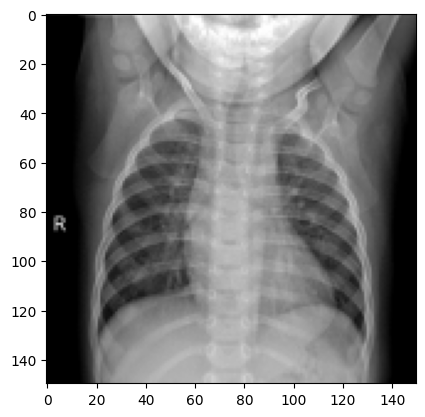

In [11]:
# Abrir una imagen de entrenamiento
plt.imshow(trainX[0])

In [12]:
# Define la clase `CNN` que hereda de `nn.Module` de PyTorch
class CNN(nn.Module):
    # El constructor inicializa las capas de la red
    def __init__(self, size, in_channels, out_features):
        super(CNN, self).__init__()
        # Define la sección de extracción de características
        self.features = nn.Sequential(
            # Capa convolucional 1: 32 filtros, kernel 3x3
            nn.Conv2d(in_channels=in_channels, out_channels=32, kernel_size=(3, 3), padding=1),
            nn.ReLU(),  # Función de activación
            nn.MaxPool2d(kernel_size=(2, 2)),  # Reducción de la resolución
            # Capa convolucional 2: 64 filtros, kernel 3x3
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(3, 3), padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=(2, 2)),
            # Capa convolucional 3: 128 filtros, kernel 3x3
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=(3, 3), padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=(2, 2), stride=(1, 1)), # Stride de 1 para evitar más reducción de tamaño
            nn.Dropout(0.05) # Regularización para evitar sobreajuste
        )

        # Define las capas densas (clasificador)
        self.classifier = nn.Sequential(
            nn.Flatten(),  # Aplanar los tensores para las capas densas
            nn.Dropout(0.05), # Otra capa de regularización
            # Capa lineal que toma la salida de las capas convolucionales y produce el número de clases
            nn.Linear(in_features=128 * ((size // 4) - 1) * ((size // 4) - 1), out_features=out_features),
            nn.Softmax(dim=1) # Función de activación para la clasificación multiclase
        )

    # Define el flujo de datos a través de la red
    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

In [13]:
# Convierte los arreglos NumPy de datos de entrenamiento a tensores de PyTorch
# Se reordena el eje (permute) para que las dimensiones sean: (cantidad, canales, alto, ancho)
trainX_tensor = torch.tensor(trainX, dtype=torch.float32).permute(0, 3, 1, 2)
# Convierte las etiquetas de entrenamiento a tensores
trainY_tensor = torch.tensor(trainY, dtype=torch.float32)
# Realiza la misma conversión para los datos y etiquetas de validación
valX_tensor = torch.tensor(valX, dtype=torch.float32).permute(0, 3, 1, 2)
valY_tensor = torch.tensor(valY, dtype=torch.float32)

# Define el tamaño de los lotes (batch) para el entrenamiento
batch_size = 32

# Crea un `TensorDataset` para agrupar los datos y etiquetas de entrenamiento y validación
dataset_train = torch.utils.data.TensorDataset(trainX_tensor, trainY_tensor)
dataset_val = torch.utils.data.TensorDataset(valX_tensor, valY_tensor)

# Crea un `DataLoader` para cargar los datos en lotes durante el entrenamiento
# Se usa `shuffle=True` para mezclar los datos de entrenamiento en cada época
train_loader = torch.utils.data.DataLoader(dataset_train, batch_size=batch_size, shuffle=True)
# Se crea un DataLoader similar para la validación, sin mezclar los datos (`shuffle=False`)
val_loader = torch.utils.data.DataLoader(dataset_val, batch_size=batch_size, shuffle=False)

In [14]:
# Instancia el modelo CNN
s = resize # El tamaño de la imagen, definido previamente
model = CNN(s, 3, len(le.classes_)) # Se pasa el tamaño, canales de entrada (3 para RGB) y el número de clases
print(model) # Imprime la arquitectura del modelo

# Define la función de pérdida y el optimizador para el modelo
# `CrossEntropyLoss` es ideal para problemas de clasificación multiclase
criterion = nn.CrossEntropyLoss()
# `Adam` es un optimizador popular y eficiente para redes neuronales
optimizer = optim.Adam(model.parameters())

# Define el número de épocas para el entrenamiento
epochs = 25

# Listas para almacenar las métricas de entrenamiento y validación en cada época
loss_history_train = []
loss_history_val = []
accuracy_history_train = []
accuracy_history_val = []

CNN(
  (features): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU()
    (8): MaxPool2d(kernel_size=(2, 2), stride=(1, 1), padding=0, dilation=1, ceil_mode=False)
    (9): Dropout(p=0.05, inplace=False)
  )
  (classifier): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Dropout(p=0.05, inplace=False)
    (2): Linear(in_features=165888, out_features=2, bias=True)
    (3): Softmax(dim=1)
  )
)


In [ ]:
# Cargar un modelo, en caso de que haya
#model = torch.load("COVID_19_CNN.pth")

In [15]:
# Bucle principal de entrenamiento, que itera por el número de épocas
for epoch in tqdm(range(epochs)):
    try:
        # Se pone el modelo en modo de entrenamiento
        model.train()
        running_loss = 0.0
        # Itera sobre los lotes de datos de entrenamiento
        for (X_, y_) in train_loader:
            # Resetea los gradientes para cada lote
            optimizer.zero_grad()

            # Pasa los datos por el modelo y calcula la pérdida
            outputs = model(X_)
            loss = criterion(outputs, y_)
            # Realiza la retropropagación para calcular los gradientes
            loss.backward()
            # Actualiza los pesos del modelo
            optimizer.step()

            # Acumula la pérdida para la época
            running_loss += loss.item()

        # Calcula y guarda la pérdida y precisión promedio para la época de entrenamiento
        loss_history_train.append(running_loss / (len(trainX_tensor)/batch_size))
        # Calcula la precisión comparando las predicciones (el índice con el valor más alto) con las etiquetas reales
        accuracy_history_train.append((outputs.argmax(1) == y_.argmax(1)).float().mean().item())

        # Bucle de validación para evaluar el modelo sin actualizar los pesos
        model.eval()
        val_loss = 0.0
        # Desactiva el cálculo de gradientes para ahorrar memoria y computación
        with torch.no_grad():
            for (X_, y_) in val_loader:
                outputs = model(X_)
                loss = criterion(outputs, y_)
                val_loss += loss.item()

            # Calcula y guarda la pérdida y precisión promedio de validación
            loss_history_val.append(val_loss / (len(valX_tensor)/batch_size))
            accuracy_history_val.append((outputs.argmax(1) == y_.argmax(1)).float().mean().item())

    except KeyboardInterrupt:
        print("Entrenamiento interrumpido.")
        break

    # Imprime el progreso del entrenamiento en cada época
    print(f" Epoch {epoch+1}/{epochs}, Train Loss: {loss_history_train[-1]:.4f}, Val Loss: {loss_history_val[-1]:.4f}, Train Accuracy: {accuracy_history_train[-1]}, Val Accuracy {accuracy_history_val[-1]}")

# Mensaje final al terminar el entrenamiento
print("Finished Training")

  4%|▍         | 1/25 [00:28<11:14, 28.09s/it]

 Epoch 1/25, Train Loss: 0.8052, Val Loss: 0.7004, Train Accuracy: 0.53125, Val Accuracy 0.53125


  8%|▊         | 2/25 [00:54<10:19, 26.93s/it]

 Epoch 2/25, Train Loss: 0.6673, Val Loss: 0.5890, Train Accuracy: 0.71875, Val Accuracy 0.75


 12%|█▏        | 3/25 [01:21<09:56, 27.13s/it]

 Epoch 3/25, Train Loss: 0.5659, Val Loss: 0.4966, Train Accuracy: 0.84375, Val Accuracy 0.875


 16%|█▌        | 4/25 [01:48<09:25, 26.95s/it]

 Epoch 4/25, Train Loss: 0.4824, Val Loss: 0.4832, Train Accuracy: 0.78125, Val Accuracy 0.875


 20%|██        | 5/25 [02:16<09:06, 27.33s/it]

 Epoch 5/25, Train Loss: 0.4447, Val Loss: 0.4631, Train Accuracy: 0.9375, Val Accuracy 0.875


 24%|██▍       | 6/25 [02:42<08:31, 26.90s/it]

 Epoch 6/25, Train Loss: 0.4271, Val Loss: 0.4292, Train Accuracy: 0.90625, Val Accuracy 0.9375


 28%|██▊       | 7/25 [03:10<08:12, 27.35s/it]

 Epoch 7/25, Train Loss: 0.4231, Val Loss: 0.4461, Train Accuracy: 0.84375, Val Accuracy 0.90625


 32%|███▏      | 8/25 [03:37<07:40, 27.07s/it]

 Epoch 8/25, Train Loss: 0.4186, Val Loss: 0.4454, Train Accuracy: 0.90625, Val Accuracy 0.875


 36%|███▌      | 9/25 [04:03<07:12, 27.01s/it]

 Epoch 9/25, Train Loss: 0.4193, Val Loss: 0.4576, Train Accuracy: 0.9375, Val Accuracy 0.84375


 40%|████      | 10/25 [04:31<06:47, 27.16s/it]

 Epoch 10/25, Train Loss: 0.3995, Val Loss: 0.4374, Train Accuracy: 0.90625, Val Accuracy 0.875


 44%|████▍     | 11/25 [04:58<06:19, 27.07s/it]

 Epoch 11/25, Train Loss: 0.3834, Val Loss: 0.4365, Train Accuracy: 0.96875, Val Accuracy 0.875


 48%|████▊     | 12/25 [05:25<05:50, 26.98s/it]

 Epoch 12/25, Train Loss: 0.3699, Val Loss: 0.4696, Train Accuracy: 0.84375, Val Accuracy 0.875


 52%|█████▏    | 13/25 [05:52<05:26, 27.24s/it]

 Epoch 13/25, Train Loss: 0.3884, Val Loss: 0.4290, Train Accuracy: 0.96875, Val Accuracy 0.90625


 56%|█████▌    | 14/25 [06:18<04:55, 26.86s/it]

 Epoch 14/25, Train Loss: 0.3834, Val Loss: 0.4107, Train Accuracy: 0.9375, Val Accuracy 0.90625


 60%|██████    | 15/25 [06:44<04:26, 26.62s/it]

 Epoch 15/25, Train Loss: 0.3581, Val Loss: 0.4267, Train Accuracy: 0.90625, Val Accuracy 0.90625


 64%|██████▍   | 16/25 [07:10<03:57, 26.41s/it]

 Epoch 16/25, Train Loss: 0.3613, Val Loss: 0.4477, Train Accuracy: 0.96875, Val Accuracy 0.84375


 68%|██████▊   | 17/25 [07:38<03:33, 26.73s/it]

 Epoch 17/25, Train Loss: 0.3522, Val Loss: 0.4380, Train Accuracy: 0.9375, Val Accuracy 0.875


 72%|███████▏  | 18/25 [08:04<03:06, 26.63s/it]

 Epoch 18/25, Train Loss: 0.3469, Val Loss: 0.4281, Train Accuracy: 1.0, Val Accuracy 0.90625


 76%|███████▌  | 19/25 [08:30<02:38, 26.41s/it]

 Epoch 19/25, Train Loss: 0.3533, Val Loss: 0.4235, Train Accuracy: 0.9375, Val Accuracy 0.9375


 80%|████████  | 20/25 [08:56<02:11, 26.27s/it]

 Epoch 20/25, Train Loss: 0.3500, Val Loss: 0.4213, Train Accuracy: 0.96875, Val Accuracy 0.90625


 84%|████████▍ | 21/25 [09:22<01:44, 26.18s/it]

 Epoch 21/25, Train Loss: 0.3450, Val Loss: 0.4295, Train Accuracy: 1.0, Val Accuracy 0.90625


 88%|████████▊ | 22/25 [09:48<01:17, 25.98s/it]

 Epoch 22/25, Train Loss: 0.3422, Val Loss: 0.4234, Train Accuracy: 0.9375, Val Accuracy 0.90625


 92%|█████████▏| 23/25 [10:14<00:52, 26.08s/it]

 Epoch 23/25, Train Loss: 0.3408, Val Loss: 0.4167, Train Accuracy: 0.9375, Val Accuracy 0.90625


 96%|█████████▌| 24/25 [10:40<00:25, 25.99s/it]

 Epoch 24/25, Train Loss: 0.3413, Val Loss: 0.4079, Train Accuracy: 1.0, Val Accuracy 0.9375


100%|██████████| 25/25 [11:04<00:00, 26.57s/it]

 Epoch 25/25, Train Loss: 0.3341, Val Loss: 0.4277, Train Accuracy: 0.9375, Val Accuracy 0.9375
Finished Training


In [16]:
# Convierte los datos de prueba a tensores de PyTorch y ajusta las dimensiones
testX_tensor = torch.tensor(testX, dtype=torch.float32).permute(0, 3, 1, 2)
# Convierte las etiquetas de prueba a tensores
testY_tensor = torch.tensor(testY, dtype=torch.float32)

# Coloca el modelo en modo de evaluación para desactivar capas como Dropout
model.eval()
# Desactiva el cálculo de gradientes, ya que no se necesitan para la inferencia
with torch.no_grad():
    # Realiza las predicciones del modelo en el conjunto de prueba
    outputs = model(testX_tensor)
    # Calcula la precisión comparando las predicciones con las etiquetas reales
    accuracy = (outputs.argmax(1) == testY_tensor.argmax(1)).float().mean()
    # Imprime el resultado de la precisión
    print(f'Accuracy: {accuracy * 100:.2f}%')

Accuracy: 87.00%


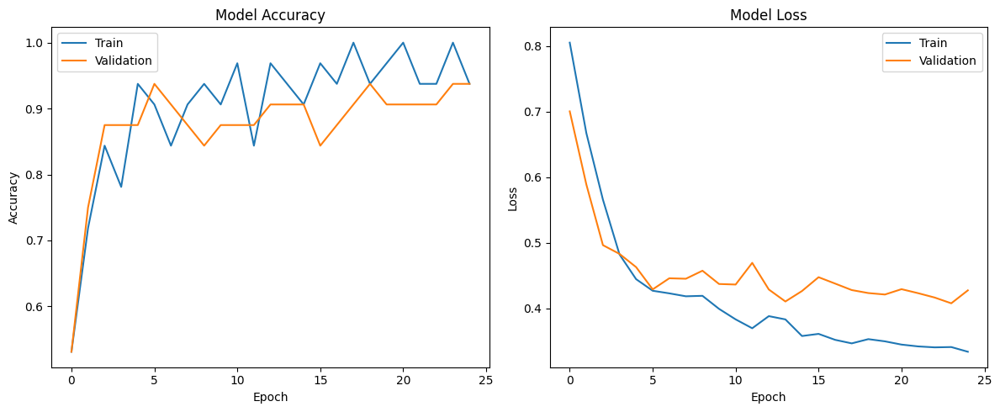

In [17]:
# Crea una figura con un tamaño específico para contener los dos gráficos
plt.figure(figsize=(12, 5))

# --- Gráfico de Precisión (Accuracy) ---
# Crea un subplot en la primera posición para mostrar la precisión
plt.subplot(1, 2, 1)
# Traza la precisión del entrenamiento
plt.plot(accuracy_history_train)
# Traza la precisión de la validación
plt.plot(accuracy_history_val)
# Asigna el título, etiquetas de los ejes y la leyenda del gráfico
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'])

# --- Gráfico de Pérdida (Loss) ---
# Crea un segundo subplot en la segunda posición para mostrar la pérdida
plt.subplot(1, 2, 2)
# Traza la pérdida del entrenamiento
plt.plot(loss_history_train)
# Traza la pérdida de la validación
plt.plot(loss_history_val)
# Asigna el título, etiquetas de los ejes y la leyenda del segundo gráfico
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'])

# Ajusta automáticamente los parámetros del subplot para evitar superposiciones
plt.tight_layout()
# Muestra los gráficos
plt.show()

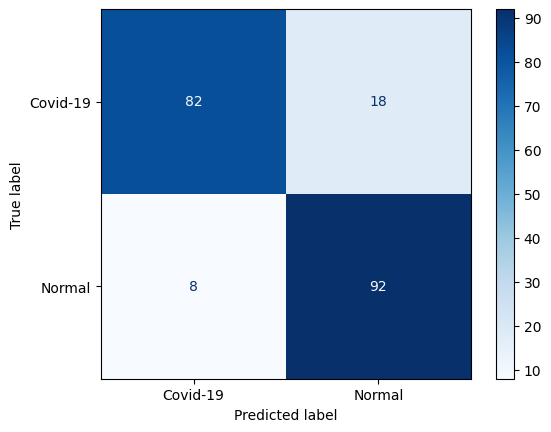

In [18]:
# Generamos la matriz de confusión
y_pred = model(testX_tensor).argmax(1)
cm = confusion_matrix(testY_tensor.argmax(1), y_pred)

# Display
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=le.classes_)
disp.plot(cmap="Blues")
plt.show()

In [19]:
# Reporte de clasificación
print(classification_report(testY_tensor.argmax(1), y_pred, target_names=le.classes_))

              precision    recall  f1-score   support

    Covid-19       0.91      0.82      0.86       100
      Normal       0.84      0.92      0.88       100

    accuracy                           0.87       200
   macro avg       0.87      0.87      0.87       200
weighted avg       0.87      0.87      0.87       200



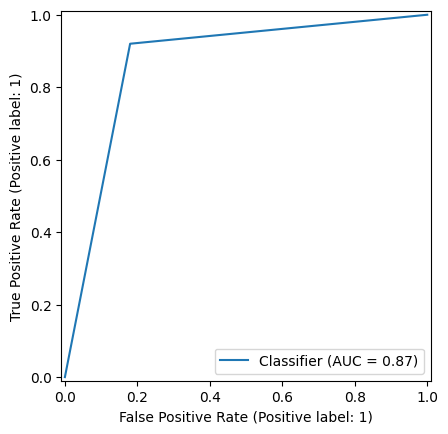

In [28]:
# Curva AUC-ROC
from sklearn.metrics import roc_auc_score
from sklearn.metrics import RocCurveDisplay

auc_score = roc_auc_score(testY_tensor.argmax(1), y_pred)
RocCurveDisplay.from_predictions(testY_tensor.argmax(1), y_pred)
plt.show()

In [20]:
# Guardamos el modelo
torch.save(model.state_dict(), 'COVID_19_CNN.pth')